In [1]:
!nvidia-smi

Thu Sep 18 00:06:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   29C    P0             45W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Environment setup

In [3]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 832.4/832.4 kB 50.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 67.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.7/88.7 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 116.8 MB/s eta 0:00:00


In [4]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import roboflow
import supervision
import transformers
import pytorch_lightning

print(
    "roboflow:", roboflow.__version__,
    "; supervision:", supervision.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.8 ; cuda:  cu126
roboflow: 1.2.9 ; supervision: 0.3.0 ; transformers: 4.56.1 ; pytorch_lightning: 2.5.5


In [5]:
import torch
from transformers import DetrForObjectDetection, DetrImageProcessor


# settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
model.to(DEVICE)


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for layer1.0.conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

### Inference

In [6]:
from getpass import getpass

ROBOFLOW_API_KEY = getpass('Enter ROBOFLOW_API_KEY secret value: ')
#Ch9ff7lRKZ2Yu546Wz3E

Enter ROBOFLOW_API_KEY secret value: ··········


In [7]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from roboflow import Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("tanmmay-koli").project("building-detection-dn7vv-hpdll")
dataset = project.version(2).download("coco")

/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to building-detection-2 in coco:: 100%|██████████| 536/536 [00:00<00:00, 4684.55it/s]


In [8]:
dataset.location

'/content/datasets/building-detection-2'

In [9]:
import os
import torchvision


# settings
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset.location, "train")
VAL_DIRECTORY = os.path.join(dataset.location, "valid")
TEST_DIRECTORY = os.path.join(dataset.location, "test")


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 462
Number of validation examples: 44
Number of test examples: 22


Image #258


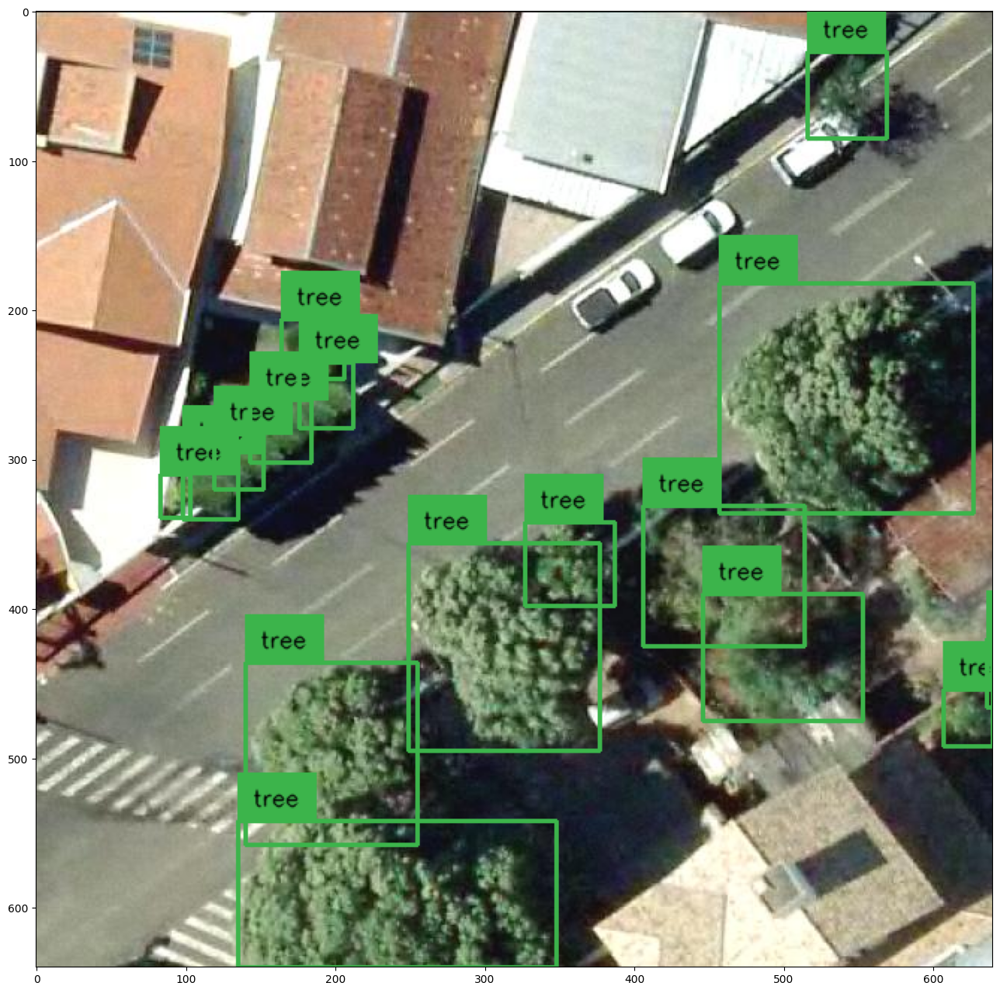

In [12]:
import random
import cv2
import numpy as np
import supervision as sv

# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

In [13]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible
    # to directly batch together images. Hence they pad the images to the biggest
    # resolution in a given batch, and create a corresponding binary pixel_mask
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

In [14]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

**NOTE:** Let's start `tensorboard`.

In [16]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
for layer1.0.conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass

In [17]:
outputs.logits.shape

torch.Size([4, 100, 3])

In [15]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/content


<IPython.core.display.Javascript object>

In [18]:
from pytorch_lightning import Trainer

%cd {HOME}

# settings
MAX_EPOCHS = 50

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


/content


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params | Mode
--------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | eval
--------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.008   Total estimated model params size (MB)
0         Modules in train mode
399       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/loops/fit_loop.py:527: Found 399 module(s) in eval mode at the start of training. This may le

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [ ]:
model.to(DEVICE)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Image #3
ground truth


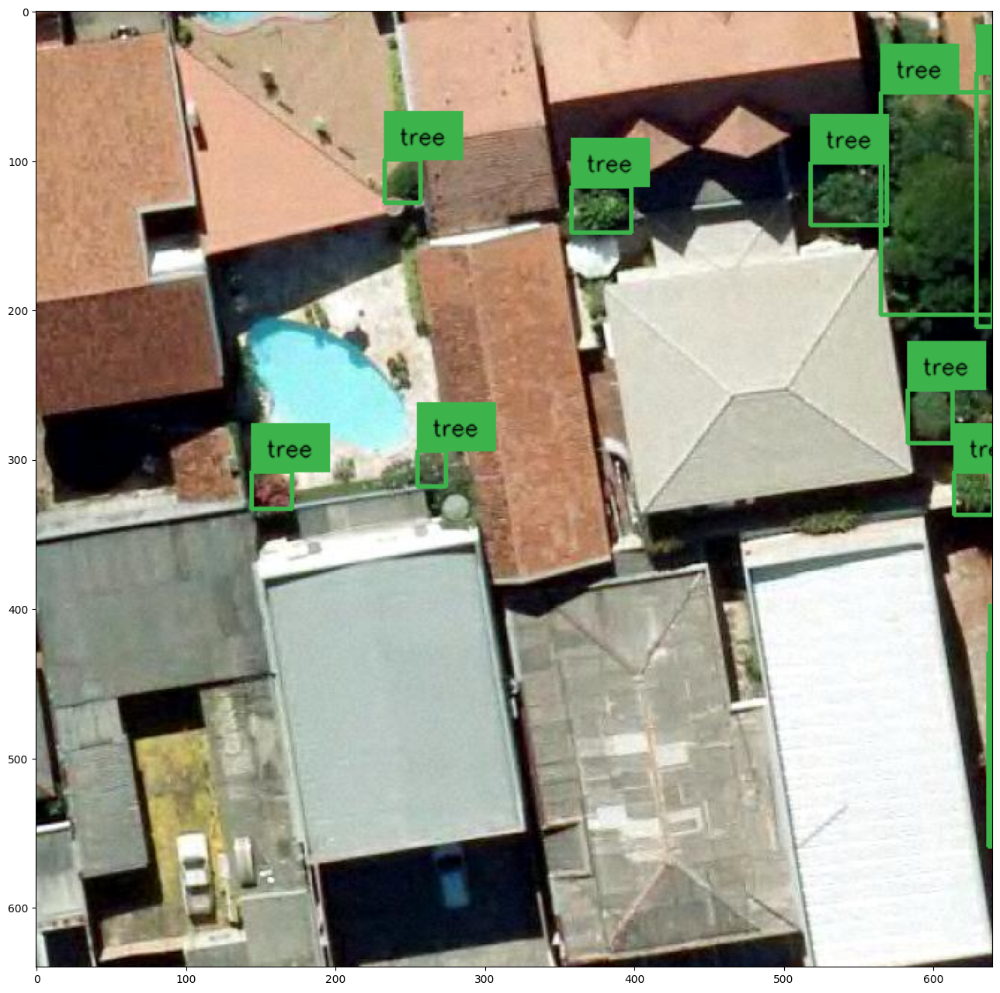

detections


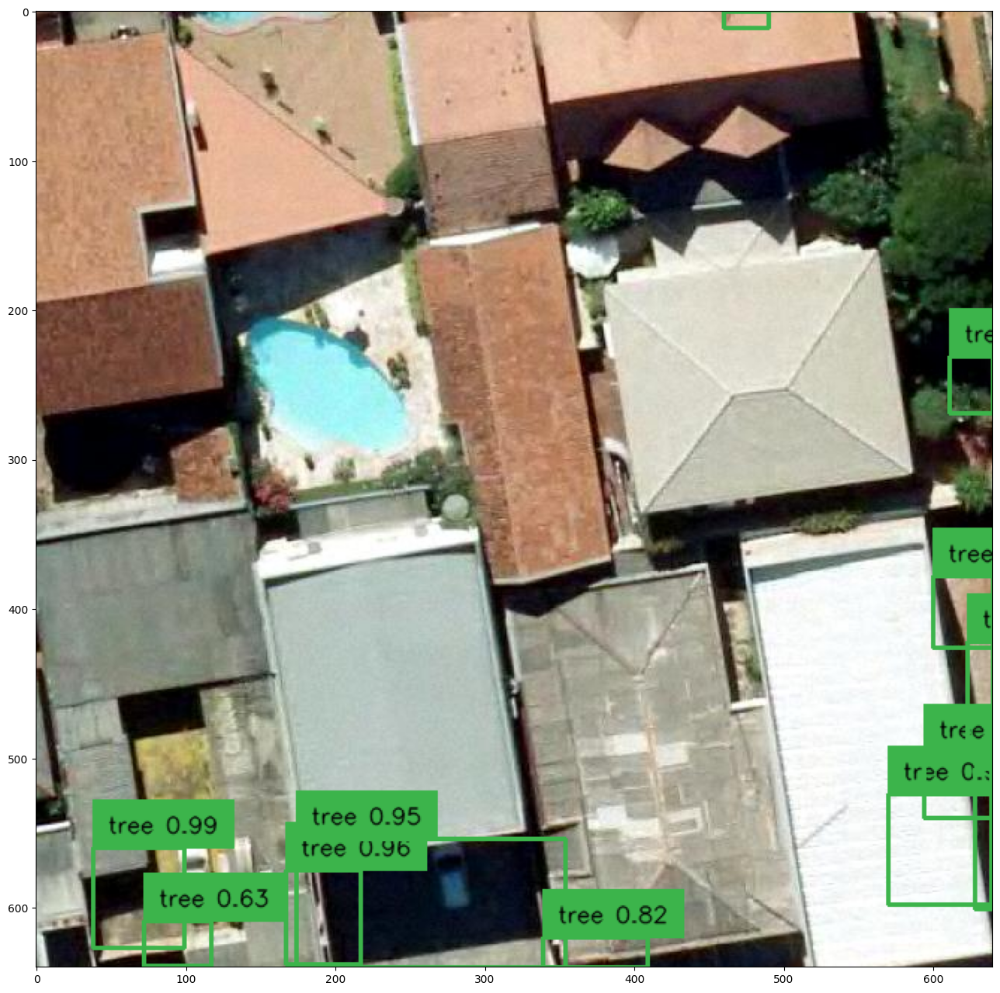

In [40]:
import random
import cv2
import numpy as np


# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('ground truth')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

# inference
with torch.no_grad():
    # 1) make sure model is on a single, known device
    try:
        # if you're using the LightningModule "Detr", its inner HF model is in .model
        core = model.model if hasattr(model, "model") else model
        core.to(DEVICE)
        core.eval()
    except Exception:
        # fallback: use whatever device the model is already on
        core = model

    # 2) use the model's actual device (robust if DEVICE differs)
    model_device = next(core.parameters()).device

    # 3) preprocess and move inputs to the same device
    inputs = {k: v.to(model_device) for k, v in inputs.items()}

    # 4) forward pass
    outputs = core(**inputs)

    # 5) post-process on the same device
    target_sizes = torch.tensor([image.shape[:2]], device=model_device)  # (H, W)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

In [21]:
!pip install -q coco_eval

  Preparing metadata (setup.py) ... done


In [41]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [42]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])

print("Running evaluation...")

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

Running evaluation...


  0%|          | 0/6 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.663
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.303
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.473
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.192
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.396
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

Using device: cuda
❌ Could not load custom model, using pretrained model


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

📤 Please upload a satellite image for detection:


Saving Google_Map_Image_0_3.jpeg to Google_Map_Image_0_3.jpeg
📁 Uploaded: Google_Map_Image_0_3.jpeg
🔍 Running detection...
✅ Found 0 detections


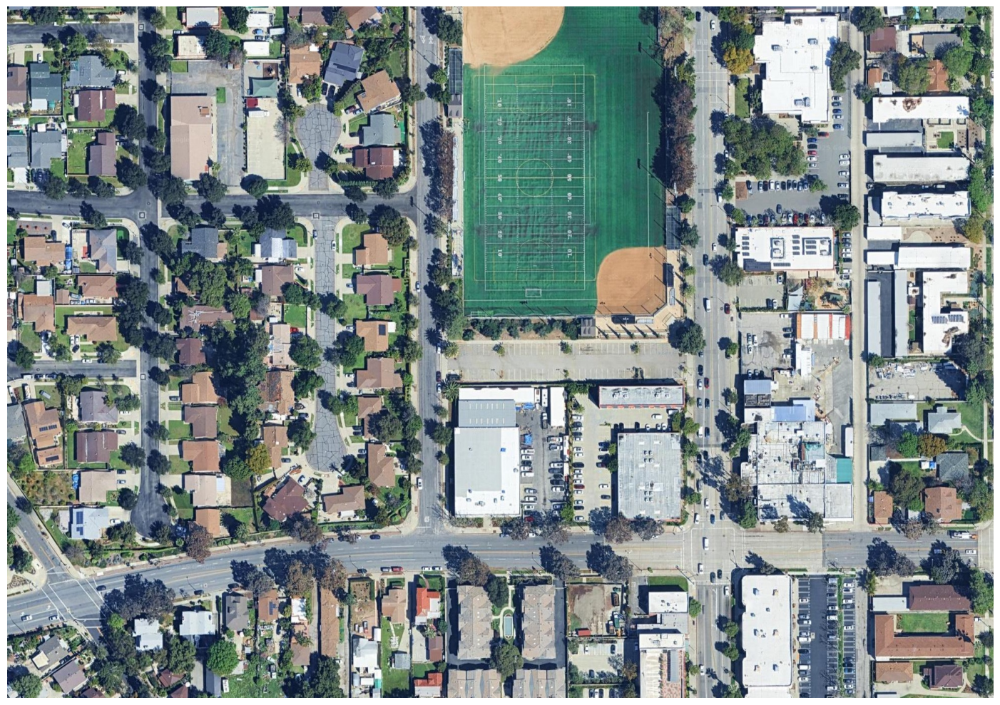


📊 Detection Summary:

💾 Results saved to: detection_results.jpg

⬇️  Download results? (y/n): n


In [43]:
# Satellite Image Upload and Inference Cell
import torch
from transformers import DetrImageProcessor, DetrForObjectDetection
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import files
import os
import supervision as sv

# Set device
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# Load your trained model
MODEL_PATH = os.path.join(HOME, 'custom-model')
try:
    model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
    model.to(DEVICE)
    model.eval()
    print("✅ Custom model loaded successfully")
except:
    print("❌ Could not load custom model, using pretrained model")
    model = DetrForObjectDetection.from_pretrained('facebook/detr-resnet-50')
    model.to(DEVICE)
    model.eval()

# Load image processor
image_processor = DetrImageProcessor.from_pretrained('facebook/detr-resnet-50')

# Load class labels (update these based on your actual classes from your training)
id2label = {
    0: "background",
    1: "building",  # Update with your actual class names from your dataset
    # Add more classes as needed based on your training
    # You can get these from your dataset: id2label = {k: v['name'] for k,v in categories.items()}
}

def run_inference_on_image(image_path, confidence_threshold=0.5):
    """
    Run inference on a single image
    """
    # Load and preprocess image
    image = Image.open(image_path).convert('RGB')
    original_size = image.size

    # Prepare image for model
    inputs = image_processor(images=image, return_tensors="pt").to(DEVICE)

    # Run inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Post-process results
    target_sizes = torch.tensor([image.size[::-1]]).to(DEVICE)  # [height, width]
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        target_sizes=target_sizes,
        threshold=confidence_threshold
    )[0]

    # Extract detections
    boxes = results['boxes'].cpu().numpy()
    scores = results['scores'].cpu().numpy()
    labels = results['labels'].cpu().numpy()

    return image, boxes, scores, labels

def visualize_detections(image, boxes, scores, labels):
    """
    Visualize detections on the image
    """
    # Convert PIL image to numpy array
    image_np = np.array(image)

    # Create visualization
    fig, ax = plt.subplots(1, 1, figsize=(16, 10))
    ax.imshow(image_np)

    # Draw bounding boxes
    for box, score, label in zip(boxes, scores, labels):
        x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        # Draw rectangle
        rect = plt.Rectangle((x1, y1), width, height,
                            fill=False, color='red', linewidth=2)
        ax.add_patch(rect)

        # Add label
        label_text = f"{id2label.get(label, f'Class {label}')}: {score:.2f}"
        ax.text(x1, y1 - 10, label_text,
               color='red', fontsize=12,
               bbox=dict(facecolor='white', alpha=0.8))

    ax.axis('off')
    plt.tight_layout()
    return fig

# Upload image
print("📤 Please upload a satellite image for detection:")
uploaded = files.upload()

# Process uploaded image
if uploaded:
    # Get the uploaded file
    image_name = list(uploaded.keys())[0]
    image_path = image_name

    print(f"📁 Uploaded: {image_name}")
    print("🔍 Running detection...")

    # Run inference
    confidence_threshold = 0.5  # Adjust as needed
    image, boxes, scores, labels = run_inference_on_image(image_path, confidence_threshold)

    # Visualize results
    print(f"✅ Found {len(boxes)} detections")
    fig = visualize_detections(image, boxes, scores, labels)
    plt.show()

    # Print detection summary
    print("\n📊 Detection Summary:")
    print("=" * 40)
    for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
        class_name = id2label.get(label, f"Class {label}")
        print(f"{i+1}. {class_name}: {score:.3f} confidence")

    # Save results
    output_path = "detection_results.jpg"
    fig.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"\n💾 Results saved to: {output_path}")

    # Offer download
    download = input("\n⬇️  Download results? (y/n): ")
    if download.lower() == 'y':
        files.download(output_path)
        print("📥 Download started...")

else:
    print("❌ No image uploaded. Please run this cell again to upload an image.")

In [ ]:
# === Metrics & Graphs: mAP / Precision / Recall + Train/Val Loss ===
import os, glob, json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from tensorboard.backend.event_processing import event_accumulator

In [44]:
# ---------- 1) COCO evaluation on VALIDATION split ----------
def detr_val_preds_to_coco(model, dataloader, processor, device, conf_thresh=0.0):
    model.eval()
    preds = []
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Infer (val)"):
            pixel_values = batch["pixel_values"].to(device)
            pixel_mask   = batch["pixel_mask"].to(device)
            # labels only needed for orig_size/image_id; keep on CPU but okay if moved
            labels       = [{k: (v.to(device) if isinstance(v, torch.Tensor) else v)
                             for k, v in t.items()} for t in batch["labels"]]

            outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)
            target_sizes = torch.stack([t["orig_size"] for t in labels]).to(device)
            results = processor.post_process_object_detection(
                outputs=outputs,
                target_sizes=target_sizes,
                threshold=conf_thresh
            )

            for lab, res in zip(labels, results):
                img_id = int(lab["image_id"])
                boxes  = res["boxes"].cpu().numpy()   # [x1,y1,x2,y2]
                scores = res["scores"].cpu().numpy()
                cls    = res["labels"].cpu().numpy()
                for (x1,y1,x2,y2), s, c in zip(boxes, scores, cls):
                    preds.append({
                        "image_id": img_id,
                        "category_id": int(c),                           # assumes labels match COCO ids
                        "bbox": [float(x1), float(y1), float(x2-x1), float(y2-y1)],
                        "score": float(s)
                    })
    return preds

def plot_pr_curves(coco_eval, class_names=None, iou=0.50):
    precisions = coco_eval.eval['precision']         # [T, R, K, A, M]
    iou_thrs   = coco_eval.params.iouThrs            # shape [T]
    rec_thrs   = coco_eval.params.recThrs            # shape [R]
    cat_ids    = coco_eval.params.catIds
    if class_names is None:
        class_names = [c['name'] for c in coco_eval.cocoGt.loadCats(cat_ids)]

    # pick IoU close to requested
    iou_idx = int(np.argmin(np.abs(iou_thrs - iou)))
    area_idx = 0
    maxdet_idx = len(coco_eval.params.maxDets) - 1

    # plot one figure per class (limit if many)
    max_classes_to_show = min(len(class_names), 8)
    for k in range(max_classes_to_show):
        pr = precisions[iou_idx, :, k, area_idx, maxdet_idx]
        pr = pr[pr > -1]
        plt.figure(figsize=(5,4))
        plt.plot(rec_thrs[:len(pr)], pr)
        plt.title(f"PR @IoU={iou:.2f} — {class_names[k]}")
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

def plot_ap_per_class(coco_eval, class_names=None, iou=0.50):
    # Estimate AP@IoU for each class by averaging precision across recall (standard COCO uses integration)
    precisions = coco_eval.eval['precision']  # [T, R, K, A, M]
    iou_thrs   = coco_eval.params.iouThrs
    cat_ids    = coco_eval.params.catIds
    if class_names is None:
        class_names = [c['name'] for c in coco_eval.cocoGt.loadCats(cat_ids)]

    iou_idx = int(np.argmin(np.abs(iou_thrs - iou)))
    area_idx = 0
    maxdet_idx = len(coco_eval.params.maxDets) - 1

    ap_vals = []
    for k in range(len(class_names)):
        pr = precisions[iou_idx, :, k, area_idx, maxdet_idx]
        pr = pr[pr > -1]
        ap_vals.append(pr.mean() if pr.size else 0.0)

    order = np.argsort(ap_vals)[::-1]
    plt.figure(figsize=(8,4.5))
    plt.bar([class_names[i] for i in order], [ap_vals[i] for i in order])
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("AP (approx) @ IoU=0.50")
    plt.title("Per-class AP (higher is better)")
    plt.tight_layout()
    plt.show()

# Build COCO GT from your validation annotations
val_ann_path = os.path.join(VAL_DIRECTORY, "_annotations.coco.json")
coco_gt = COCO(val_ann_path)

# Create predictions file (threshold 0.0 to compute true curves)
val_preds = detr_val_preds_to_coco(model, VAL_DATALOADER, image_processor, DEVICE, conf_thresh=0.0)
pred_file = "val_predictions.json"
with open(pred_file, "w") as f:
    json.dump(val_preds, f)

coco_dt = coco_gt.loadRes(pred_file)

coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.evaluate(); coco_eval.accumulate(); coco_eval.summarize()

# coco_eval.stats is a 12-element array; key ones:
# [0]=mAP@[.5:.95], [1]=mAP@.5, [2]=mAP@.75, [8]=AR@[.5:.95]
print({
    "mAP_50_95": float(coco_eval.stats[0]),
    "mAP_50":    float(coco_eval.stats[1]),
    "mAP_75":    float(coco_eval.stats[2]),
    "AR_50_95":  float(coco_eval.stats[8]),
})

# Plot PR curves for up to 8 classes at IoU=0.50 and per-class AP bars
class_names = [c['name'] for c in coco_gt.loadCats(coco_gt.getCatIds())]
plot_pr_curves(coco_eval, class_names, iou=0.50)
plot_ap_per_class(coco_eval, class_names, iou=0.50)

NameError: name 'COCO' is not defined

In [ ]:
# ---------- 2) Training / Validation loss from TensorBoard logs ----------
def find_latest_tb_event_file(root="lightning_logs"):
    versions = sorted(glob.glob(os.path.join(root, "version_*")), key=os.path.getmtime)
    if not versions: return None
    latest = versions[-1]
    # there can be multiple event files; pick the newest
    event_files = sorted(glob.glob(os.path.join(latest, "events.out.tfevents.*")), key=os.path.getmtime)
    return event_files[-1] if event_files else None

event_file = find_latest_tb_event_file("lightning_logs")
if event_file is None:
    print("⚠️ No TensorBoard logs found yet in 'lightning_logs/'. Train first to log losses.")
else:
    ea = event_accumulator.EventAccumulator(event_file)
    ea.Reload()

    # Keys depend on how you logged; from your LightningModule:
    # self.log("training_loss", ...), self.log("validation/loss", ...)
    train_tag = "training_loss"
    val_tag   = "validation/loss"

    train_events = ea.Scalars(train_tag) if train_tag in ea.Tags().get('scalars', []) else []
    val_events   = ea.Scalars(val_tag)   if val_tag   in ea.Tags().get('scalars', []) else []

    if not train_events and not val_events:
        print("⚠️ Couldn't find 'training_loss' or 'validation/loss' scalars in the latest event file.")
        print("   Available scalar tags:", ea.Tags().get('scalars', []))
    else:
        # Plot losses
        plt.figure(figsize=(7,5))
        if train_events:
            steps = [e.step for e in train_events]
            vals  = [e.value for e in train_events]
            plt.plot(steps, vals, label="Train loss")
        if val_events:
            v_steps = [e.step for e in val_events]
            v_vals  = [e.value for e in val_events]
            plt.plot(v_steps, v_vals, label="Val loss")
        plt.xlabel("Step")
        plt.ylabel("Loss")
        plt.title("Training / Validation Loss (from TensorBoard logs)")
        plt.legend()
        plt.tight_layout()
        plt.show()

## Save and load model

In [ ]:
MODEL_PATH = os.path.join(HOME, 'custom-model')

In [ ]:
model.model.save_pretrained(MODEL_PATH)

In [ ]:
model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
model.to(DEVICE)

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      